# Dimensionality reduction

Import commonly used libraries. Specific libraries will be introduced as we progress.

In [98]:
import numpy as np
import pandas as pd
from matplotlib import animation
from IPython.display import display, Image
import matplotlib.pyplot as plt
import seaborn as sns

## Load the iron ore flotation data set

We will be using the iron ore flotation data set available from [Kaggle](https://www.kaggle.com/datasets/edumagalhaes/quality-prediction-in-a-mining-process). A cleaned version of the data set is used, located in `../data/IronOreFlotation_cleaned_data.csv`.

In [99]:
# Uncomment the appropriate option below
# Read the CSV file into a dataframe if the data is locally available
df = pd.read_csv('../data/IronOreFlotation_cleaned_data.csv', index_col='date', parse_dates=['date'])

# To pull the data directly from GitHub:
# df = pd.read_csv('https://raw.githubusercontent.com/Stellenbosch-University-Process-Eng/M.Eng-Data-Analytics-General-Topics/main/data/IronOreFlotation_cleaned_data.csv?token=GHSAT0AAAAAACN5L6X22PRVQ52OHYXDPY3EZQD7QYA', index_col='date', parse_dates=['date'])

df.describe().T

,count,mean,std,min,25%,50%,75%,max
d feed iron %,7306.0,54.198177,4.118539,42.740000,51.870000,54.290000,56.650000,65.780000
d feed silica %,7306.0,17.129728,6.180411,1.310000,13.040000,16.620000,21.290000,33.400000
u starch m3/h,7306.0,2957.635581,1116.279220,19.683728,2139.050000,3019.775000,3761.738750,6289.636925
u amina m3/h,7306.0,498.194264,88.152945,242.194085,445.070625,514.600750,559.954125,739.012922
d feed m3/h,7306.0,397.153616,10.108265,376.417095,396.964750,399.683000,401.074000,418.549787
d feed ph,7306.0,9.728180,0.408273,8.753379,9.483356,9.752245,10.006300,10.807715
d feed SG,7306.0,1.686009,0.065240,1.519881,1.660685,1.702030,1.728919,1.852899
x C01.air.flow Nm3/h,7306.0,283.704613,27.189643,175.948452,250.244875,299.805500,300.017000,367.932734
x C02.air.flow Nm3/h,7306.0,283.773019,26.626376,177.081208,250.610750,299.590750,300.172000,311.309000
x C03.air.flow Nm3/h,7306.0,283.564616,26.099668,180.291660,250.166750,299.509500,299.857500,306.678735


The code below will generate the pairplot for all 23 features. This is slow, so it is commented out by default below.

In [100]:
# sns.pairplot(df, diag_kind='kde')

## Projection from 2D to 1D

Let's select two variables to help explain the projection of a two-dimensional feature space down to one dimension. We can visualise the data using time series plots and pair plots (using the `seaborn` library).

array([<Axes: xlabel='date'>, <Axes: xlabel='date'>], dtype=object)

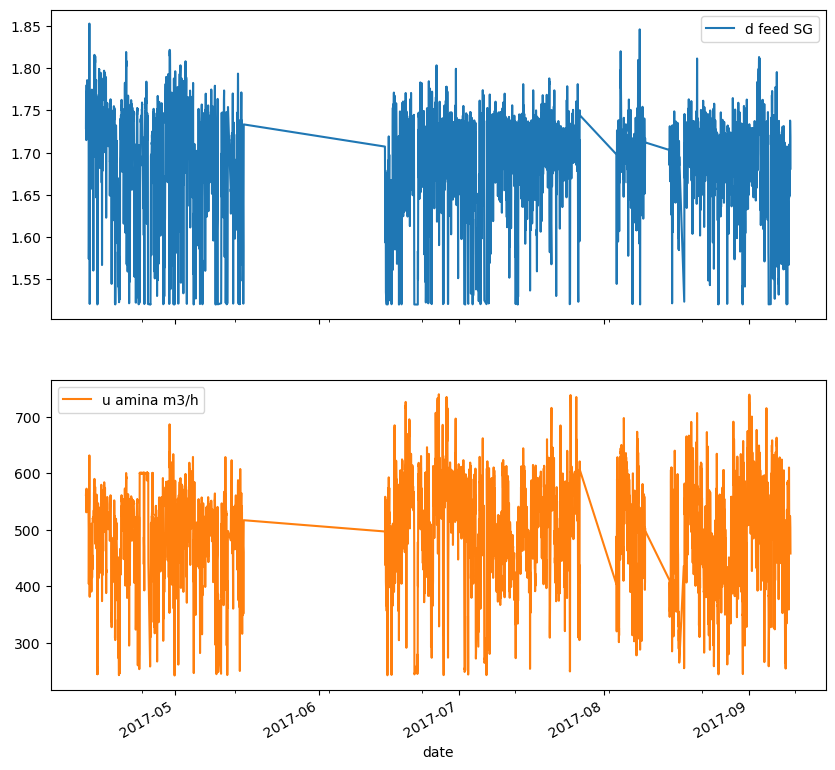

In [101]:
selectedVariables = ['d feed SG', 'u amina m3/h']
df[selectedVariables].plot(subplots=True, figsize=(10, 10)) # Use pandas to plot the data

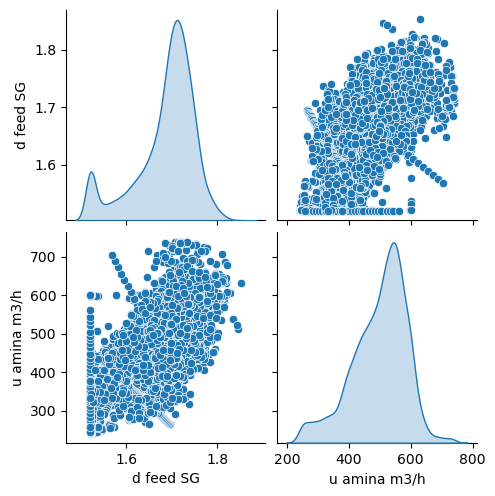

In [102]:
sns.pairplot(df[selectedVariables], diag_kind='kde')    # Use seaborn to plot the data, using Kernel Density Estimation to estimate the probability density function of the data

### Rotation of 2D data

If $ Q $ is a matrix with orthogonal columns (i.e., $ q_i \cdot q_j = 1 $ if $ i=j $, else $ q_i \cdot q_j = 0 $), then multipyling our data matrix $ X $ by $ Q $ amounts to rotating the data. In particular,

$$ Q = \begin{bmatrix} \cos(\theta) & -\sin(\theta) \\ \sin(\theta) & \cos(\theta) \ \end{bmatrix}  $$

will rotate two-dimensional data. We will define $ T = XQ $, so that $ T $ represents the rotated data. We will also plot a histogram of $ t_1 $, which is the first column in the matrix $T$ and is equivalent to the x-coordinates of the rotated data.

Let's just consider the first two features in the moons data, then rotate it in space. You can change the amount of rotation by changing `theta` below (note that `theta` is in radians, not degrees). Also note that the `@` symbol can be used for matrix multiplication in Python (as opposed to `*`, which will result in element-wise multiplication).

Notice that the scales of the various features are very different (run `df.describe()` and inspect the standard deviation to confirm). This makes it difficult to identify any _correlation_ or structure in our data. To address this problem, we will center and scale the data instead. It is recommended to center and scale data when performing dimensionality reduction. A common choice is to scale the data so that each feature has unit variance, which we can easily do this using `sklearn.preprocessing.StandardScaler`.

https://scikit-learn.org/stable/modules/generated/sklearn.preprocessing.StandardScaler.html

[]

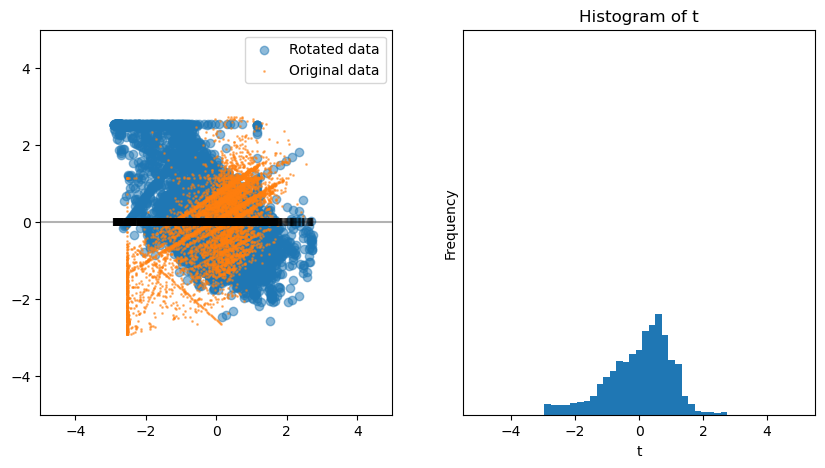

In [103]:
from sklearn.preprocessing import StandardScaler
X = StandardScaler().fit_transform(df[selectedVariables])

# Create rotation matrix
theta = 90/180*np.pi
Q = np.array([[np.cos(theta), -np.sin(theta)], [np.sin(theta), np.cos(theta)]])

# Rotate the data and plot
T = X @ Q

# Plot the original and the rotated data
fig,ax = plt.subplots(1,2, figsize = (10,5))
ax[0].clear()
ax[0].hlines(0, -20, 20, color = 'k', alpha = 0.3)  # PLot the t1-axis
ax[0].scatter(T[:,0], T[:,1], alpha = 0.5, label='Rotated data')
ax[0].scatter(X[:,0], X[:,1], alpha = 0.5, s = 1, label='Original data')
ax[0].scatter(T[:,0], np.zeros_like(T[:,0]), c='k', marker = '|', alpha = 0.2)    # Show the values of T projected onto the t1-axis
ax[0].set_xlim(-5, 5)
ax[0].set_ylim(-5, 5)
ax[0].legend()

# Draw a histogram of t1, which corresponds to the first column of T
ax[1].clear()
ax[1].hist(T[:,0], bins=np.linspace(-5,5,50),density=True)
ax[1].set_xlabel('t')
ax[1].set_ylabel('Frequency')
ax[1].set_title('Histogram of t')
ax[1].set_ylim(0, 2)
ax[1].set_yticks([])

Is it possible to calculate the rotation matrix $ Q $ that will result in the maximum variance? **Yes**, this is exactly what Principal Component Analysis (PCA) does. We will use the `sklearn.decomposition.PCA` to create a PCA object, fit it to our standardized data, then extract the rotation matrix $ Q $ that will result in the maximimum variance in our projected data.

https://scikit-learn.org/stable/modules/generated/sklearn.decomposition.PCA.html

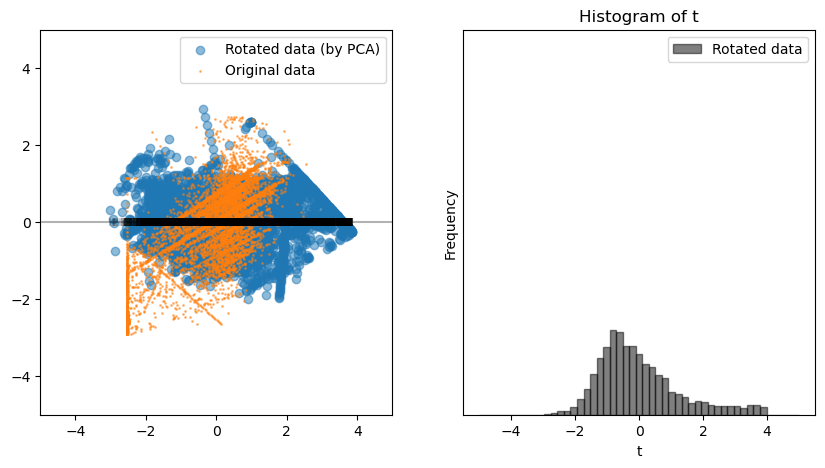

In [104]:
from sklearn.decomposition import PCA
pca = PCA()
T = pca.fit_transform(X)

fig,ax = plt.subplots(1,2, figsize = (10,5))

ax[0].clear()
ax[0].hlines(0, -20, 20, color = 'k', alpha = 0.3)  # PLot the t1-axis
ax[0].scatter(T[:,0], T[:,1], alpha = 0.5, label='Rotated data (by PCA)')
ax[0].scatter(X[:,0], X[:,1], alpha = 0.5, s = 1, label='Original data')
ax[0].scatter(T[:,0], np.zeros_like(T[:,0]), c='k', marker = '|', alpha = 0.2)    # Show the values of T projected onto the t1-axis
ax[0].set_xlim(-5, 5)
ax[0].set_ylim(-5, 5)
ax[0].legend()

# Draw a histogram of t1
ax[1].clear()
ax[1].hist(T[:,0], bins=np.linspace(-5,5,50),density=True, alpha = 0.5, color = 'k', edgecolor = 'k', label='Rotated data')
ax[1].set_xlabel('t')
ax[1].set_ylabel('Frequency')
ax[1].set_title('Histogram of t')
ax[1].set_ylim(0, 2)
ax[1].set_yticks([])
ax[1].legend()

The next piece of code creates an animation showing the data being rotated and projected onto the $t_1$ axis. It takes a minute or so to run, but the result is saved as a `.gif` file, so it need not be run every time. It is commented out below for speed.

In [105]:
# pca = PCA()
# X_pca = pca.fit_transform(X)

# fig,ax = plt.subplots(1,2, figsize = (10,5))
# def AnimationFunction(t):
#     # Create rotation matrix
#     theta = 3*t/180*np.pi
#     Q = np.array([[np.cos(theta), -np.sin(theta)], [np.sin(theta), np.cos(theta)]])

#     # Rotate the data and plot
#     T = X @ Q

#     ax[0].clear()
#     ax[0].hlines(0, -20, 20, color = 'k', alpha = 0.3)  # PLot the t1-axis
#     ax[0].scatter(T[:,0], T[:,1], alpha = 0.5, label='Rotated data')
#     ax[0].scatter(X[:,0], X[:,1], alpha = 0.5, s = 1, label='Original data')
#     ax[0].scatter(X_pca[:,0], X_pca[:,1], alpha = 0.5, s = 1, c = 'k', label='PCA scores')    
# #     ax[0].scatter(T[:,0], np.zeros_like(T[:,0]), c='k', marker = '|', alpha = 0.2)    # Show the values of T projected onto the t1-axis
#     ax[0].set_xlim(-5, 5)
#     ax[0].set_ylim(-5, 5)
#     ax[0].legend()

#     # Draw a histogram of t1
#     ax[1].clear()
#     ax[1].hist(T[:,0], bins=np.linspace(-5,5,50),density=True, alpha = 0.5, edgecolor = 'k', label='Rotated data')
#     ax[1].hist(X_pca[:,0], bins=np.linspace(-5,5,50),density=True, alpha = 0.5, color = 'k', edgecolor = 'k', label='PCA scores')
#     ax[1].set_xlabel('t')
#     ax[1].set_ylabel('Frequency')
#     ax[1].set_title('Histogram of t')
#     ax[1].set_ylim(0, 2)
#     ax[1].set_yticks([])
#     ax[1].legend()

#     print(f"Progress: {t/120*100:.2f}%")

# # Create the animation and save to file
# anim = animation.FuncAnimation(fig, AnimationFunction, frames = 120, repeat=False)

# # Create animation without PCA projection
# # f = r"..\images\data-rotation.gif" 

# # Create animation with PCA projection
# f = r"..\images\data-rotation-PCA.gif" 

# writergif = animation.PillowWriter(fps=20) 
# anim.save(f, writer=writergif)

Disply the `.gif` created in the previous section. 

*This will only be available if you have a local copy of the file available. It will not run on Colab, comment out as necessary.*

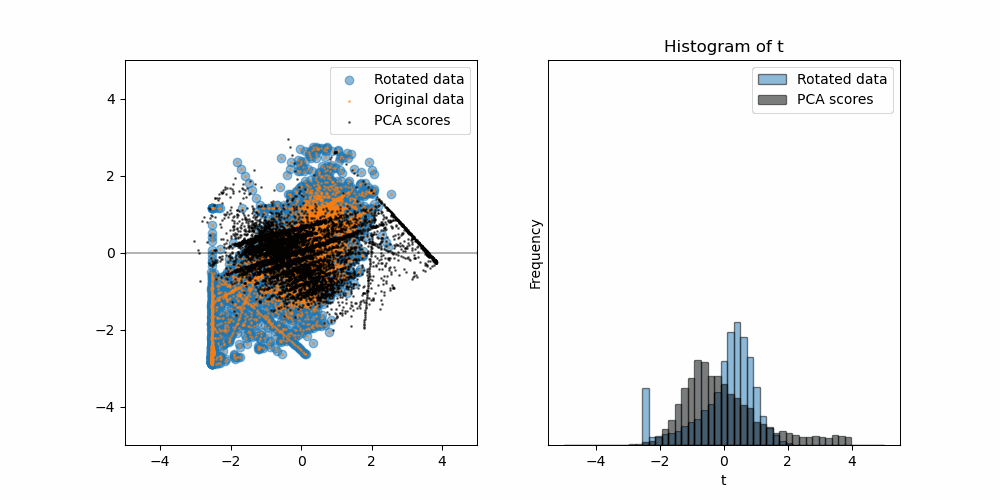

In [106]:
# Display the created gif
display(Image('..\images\data-rotation-PCA.gif'))

### Rotation in 3D

Let's now select and visualise three variables to illustrate the rotation of data in 3D.

array([<Axes: xlabel='date'>, <Axes: xlabel='date'>,
       <Axes: xlabel='date'>], dtype=object)

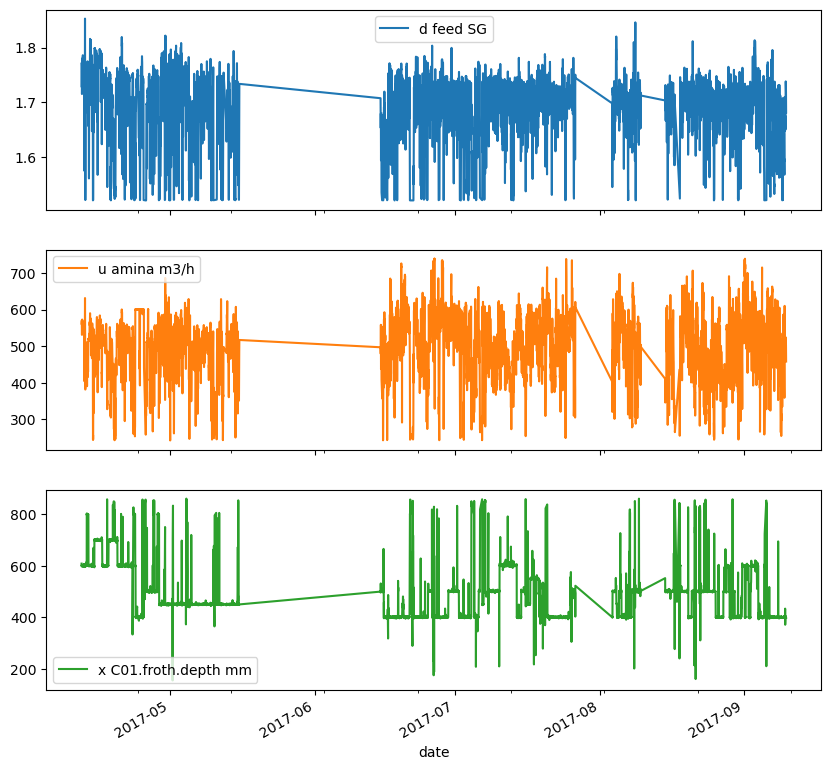

In [107]:
selectedVariables = ['d feed SG', 'u amina m3/h', 'x C01.froth.depth mm']
df[selectedVariables].plot(subplots=True, figsize=(10, 10))

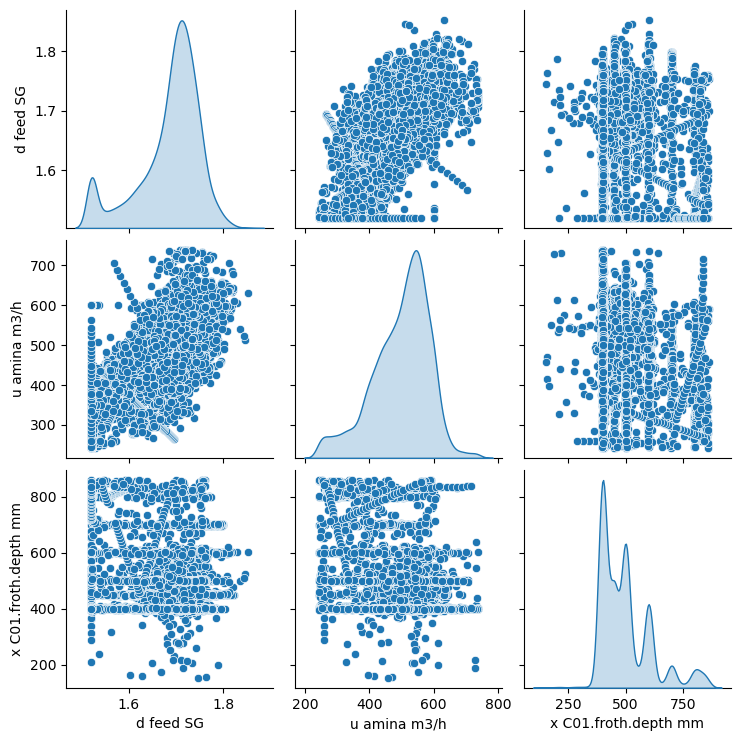

In [108]:
sns.pairplot(df[selectedVariables], diag_kind='kde')

We can plot the three variables in 3D feature space. Remember, each of the 7306 observations represents a vector in three-dimensional space (23-dimensional space for the original data set).

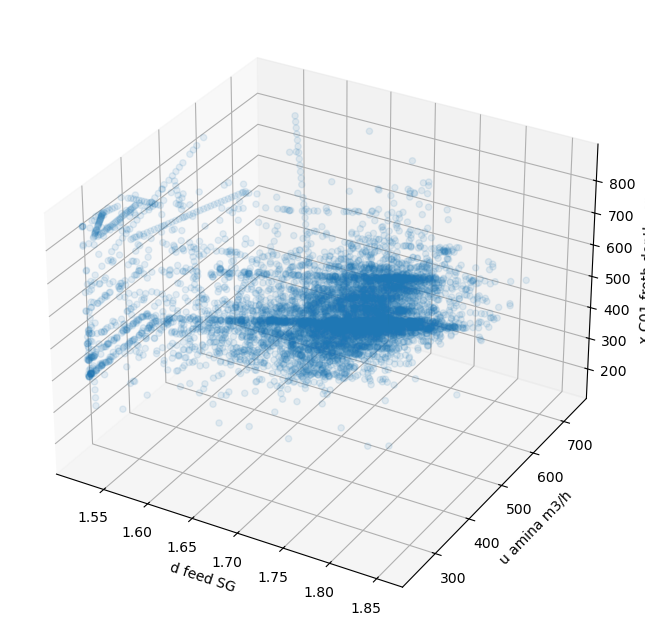

In [109]:
from mpl_toolkits.mplot3d import Axes3D
import matplotlib.pyplot as plt

fig = plt.figure(figsize=(8, 8))
ax = fig.add_subplot(111, projection='3d')
ax.scatter(df[selectedVariables[0]], df[selectedVariables[1]], df[selectedVariables[2]], alpha = 0.1)
ax.set_xlabel(selectedVariables[0])
ax.set_ylabel(selectedVariables[1])
ax.set_zlabel(selectedVariables[2])

plt.show()

We can rotate data in 3D using the $ 3 × 3 $ orthogonal matrix $ Q $ defined by:

$$ 
Q = \begin{bmatrix} \cos(\theta) & -\sin(\theta) & 0 \\ \sin(\theta) & \cos(\theta) & 0 \\ 0 & 0 & 1 \ \end{bmatrix}
       \begin{bmatrix} 1 & 0 & 0 \\ 0 & \cos(\phi) & -\sin(\phi) \\ 0 & \sin(\phi) & \cos(\phi) \ \end{bmatrix}  
$$

Here, $ \theta$ specifies the rotation around the $z$-axis and $\phi$ defines the rotation around the $x$-axis. We can rotate the data in 3D, then project the data down onto the $(t_1,t_2)$ plane.

(-5.0, 4.0)

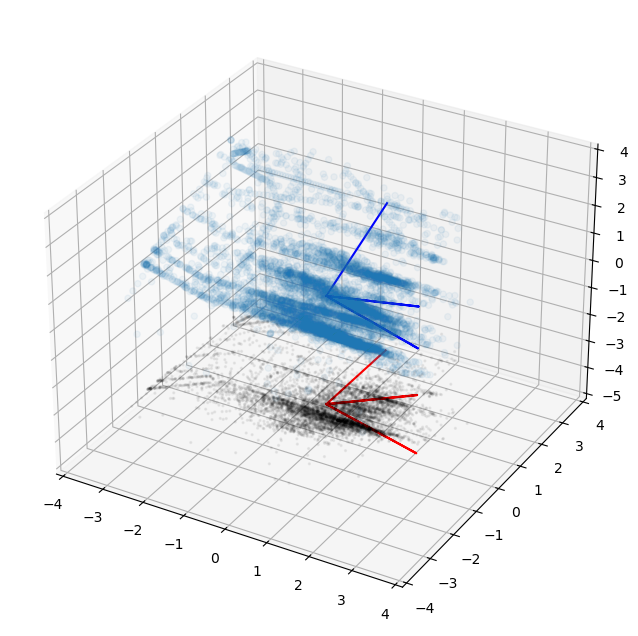

In [110]:
X = StandardScaler().fit_transform(df[selectedVariables])

# Define the rotation matrix, then rotate the scaled data
theta = 30/180*np.pi
phi = 60/180*np.pi
Q = ( np.array([[np.cos(theta), -np.sin(theta), 0], [np.sin(theta), np.cos(theta), 0],[0, 0, 1]])
    @np.array([[1, 0, 0], [0, np.cos(phi), -np.sin(phi)], [0, np.sin(phi), np.cos(phi)]]) )
T = X @ Q

# Calculate the projection of the original coordinate axes
B = 3*np.array([[0, 0, 0], [1, 0,0], [0,0 ,0],[0,1,0],[0,0,0],[0,0,1]])
TB = B @ Q

from mpl_toolkits.mplot3d import Axes3D
# Create a 3D scatter plot of the rotated data, showing the projection onto the t1-t2 plane
fig = plt.figure(figsize=(8, 8))
ax1 = fig.add_subplot(111, projection='3d')
ax1.clear()
ax1.scatter(T[:,0], T[:,1], T[:,2], alpha = 0.05)
ax1.scatter(T[:,0], T[:,1], 0*T[:,2] - 4, s = 2, c = 'k', alpha = 0.05)
ax1.plot(TB[:,0], TB[:,1], TB[:,2], c =  'blue')
ax1.plot(TB[:,0], TB[:,1], 0*TB[:,2] - 4, c = 'red')
ax1.axis('equal')
ax1.set_xlim([-4, 4])
ax1.set_ylim([-4, 4])
ax1.set_zlim([-5, 4])

As before, we can use PCA to identify the rotation that maximises the variance in the first principal components.

(-5.0, 4.0)

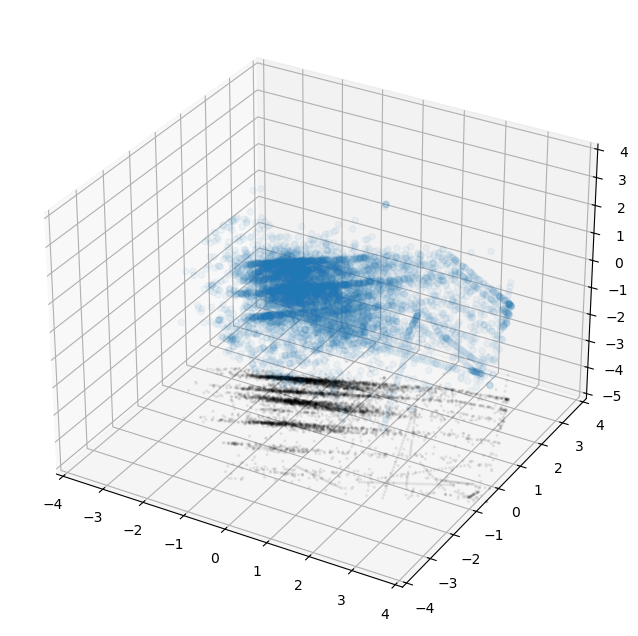

In [111]:
pca = PCA()
T = pca.fit_transform(X)

from mpl_toolkits.mplot3d import Axes3D
# Create a 3D scatter plot of the rotated data, showing the projection onto the t1-t2 plane
fig = plt.figure(figsize=(8, 8))
ax1 = fig.add_subplot(111, projection='3d')
ax1.clear()
ax1.scatter(T[:,0], T[:,1], T[:,2], alpha = 0.05)
ax1.scatter(T[:,0], T[:,1], 0*T[:,2] - 4, s = 2, c = 'k', alpha = 0.05)
ax1.axis('equal')
ax1.set_xlim([-4, 4])
ax1.set_ylim([-4, 4])
ax1.set_zlim([-5, 4])

The next piece of code again creates an animation showing the data being rotated and projected onto the $t_1$ axis. It takes a minute or so to run, but the result is saved as a `.gif` file, so it need not be run every time. It is commented out below for speed.

In [112]:
# fig = plt.figure(figsize=(8, 8))
# ax1 = fig.add_subplot(111, projection='3d')
# def AnimationFunction(t):
#      # Define the rotation matrix, then rotate the scaled data
#      theta = 3*t/180*np.pi
#      phi = 6*t/180*np.pi
#      Q = ( np.array([[np.cos(theta), -np.sin(theta), 0], [np.sin(theta), np.cos(theta), 0],[0, 0, 1]])
#           @np.array([[1, 0, 0], [0, np.cos(phi), -np.sin(phi)], [0, np.sin(phi), np.cos(phi)]]) )
#      T = X @ Q
     
#      B = 3*np.array([[0, 0, 0], [1, 0,0], [0,0 ,0],[0,1,0],[0,0,0],[0,0,1]])
#      TB = B @ Q
     
#      # Create a 3D scatter plot of the rotated data, showing the projection onto the t1-t2 plane
#      ax1.clear()
#      ax1.scatter(T[:,0], T[:,1], T[:,2], alpha = 0.05)
#      ax1.scatter(T[:,0], T[:,1], 0*T[:,2] - 4, s = 2, c = 'k', alpha = 0.05)
#      ax1.plot(TB[:,0], TB[:,1], TB[:,2], c =  'blue')
#      ax1.plot(TB[:,0], TB[:,1], 0*TB[:,2] - 4, c = 'red')
#      ax1.axis('equal')
#      ax1.set_xlim([-4, 4])
#      ax1.set_ylim([-4, 4])
#      ax1.set_zlim([-5, 4])
     
#      print(f"Progress: {t/120*100:.2f}%")

# anim = animation.FuncAnimation(fig, AnimationFunction, frames = 120, repeat=False)
# f = r"..\images\data-rotation-3D.gif"
# writergif = animation.PillowWriter(fps=20) 
# anim.save(f, writer=writergif)

Disply the `.gif` created in the previous section. 

*This will only be available if you have a local copy of the file available. It will not run on Colab, comment out as necessary.*

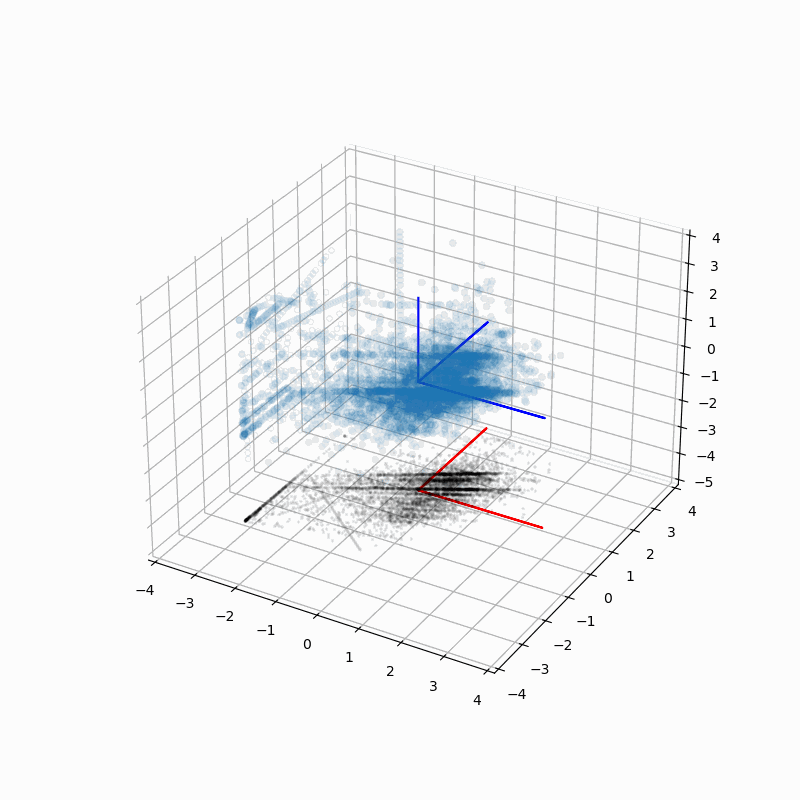

In [113]:
display(Image('..\images\data-rotation-3D.gif'))

### Principal Component Analysis on N-D data

Wecan  perform PCA on the full iron ore flotation data set, with 23 features.

https://scikit-learn.org/stable/modules/generated/sklearn.decomposition.PCA.html

(-4.667793926139857, 11.9679615641515, -4.7483090580557965, 7.254483751896435)

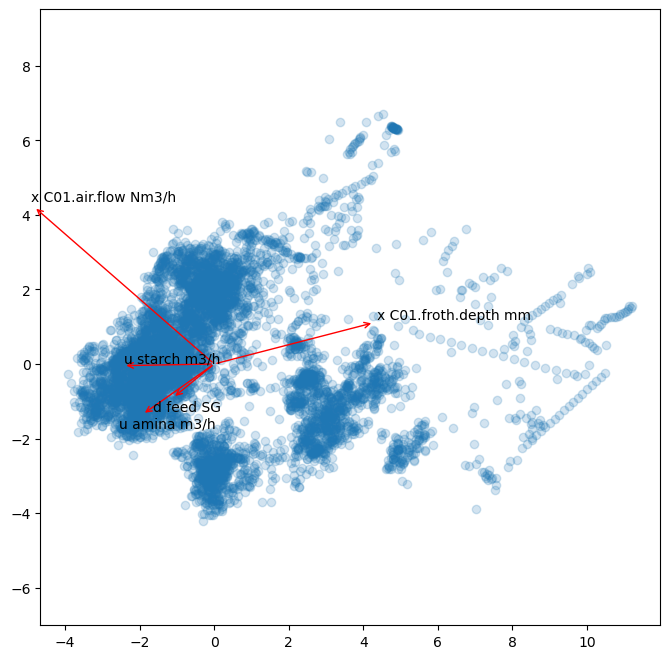

In [115]:
X = StandardScaler().fit_transform(df)
pca = PCA()
T = pca.fit_transform(X)

fig,ax = plt.subplots(figsize = (8,8))
ax.scatter(T[:, 0], T[:, 1], alpha = 0.2) # Plot the scores, coloured by month

# The code below adds the projection of the original variables onto the first two principal components.
Q = pca.components_.T   # Get the loadings

selected_variables = ['x C01.air.flow Nm3/h', 
                      'x C01.froth.depth mm', 
                      'u starch m3/h',
                      'u amina m3/h',
                      'd feed SG']

scaling_factor = 15     # The scaling factor adjusts the relative length of the arrows. Adjust as needed
for variable in selected_variables:     # Loop over the selected variables
        i = np.where(df.columns == variable)[0]     # Find the index of the variable in the dataframe
        ax.annotate(variable,                       # Create the arrow using the annotate  method
                xy=(0,0),       # Arrow start position
                xytext=(scaling_factor*Q[i,0], scaling_factor*Q[i,1]), # Arrow end position
                arrowprops=dict(color='red',arrowstyle='<-',relpos=(0,0)) # Additional arrow properties
                )

ax.axis('equal')